<a href="https://colab.research.google.com/github/Vsisik/Diplomova-praca/blob/main/colab%20notebooks/CT_Model2D_Applications.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#@title **Import libraries and define helping functions**
import os
import re
import numpy as np
import matplotlib.pyplot as plt

from datetime import datetime
from typing import Any

import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.layers import *

from keras import backend as K
from keras import Model, regularizers, Input
from keras.models import Sequential, load_model

from sklearn.model_selection import train_test_split

from google.colab import drive
drive.mount('/content/drive',  force_remount=False)


def plot_ct_images(data, rows=6, cols=6, start_with=10, show_every=3, block=True):
    fig, ax = plt.subplots(rows, cols, figsize=[8, 8])
    index = start_with
    for i in range(rows):
        for j in range(cols):
            ax[i, j].set_title(f'Scan slice {index}')
            ax[i, j].imshow(data[index], aspect='auto', cmap=plt.cm.bone)
            ax[i, j].axis('off')
            index += show_every
    plt.show(block=block)

def plot_2d_ct_images(data, rows=4, cols=4, block=True):
  fig, ax = plt.subplots(rows, cols, figsize=[14, 14])
  for i in range(rows):
    for j in range(cols):
      index = np.random.randint(0, len(data))
      ax[i, j].set_title(f'Scan slice {index}')
      ax[i, j].imshow(data[index], aspect='auto', cmap=plt.cm.bone)
      ax[i, j].axis('off')
  plt.show()

def make_gradcam_heatmap(img_array, model, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    last_conv_layer_name = list(filter(lambda x: 'convolutional' in str(x), model.layers))[-1].name
    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

import matplotlib.cm as cm
import keras
def display_gradcam(img, heatmap, alpha=0.4):
    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    # Display Grad CAM
    display(superimposed_img)


def get_model(height: int, width: int, type_: Any=1, use_pretrained: bool=False):
    """
    Function creates a model architecture based on given type_ parameter

    :param width: Width number
    :param height: Height number
    :param type_: Type of architecture
    :param use_pretrained: Bool
    :return: Tensorflow model
    """

    inputs = Input((height, width, 1))

    ############### TYPE 2 ############################
    if type_ == 2:
      regularizer = regularizers.L2(0.001)
      initializer = tf.keras.initializers.HeNormal()

      model = tf.keras.models.Sequential([
      # layer = tf.keras.layers.Dense(3, kernel_initializer=initializer)

      tf.keras.layers.Conv2D(16, (3, 3), activation='relu', input_shape=(height, width, 1), kernel_regularizer=regularizer, kernel_initializer=initializer),
      tf.keras.layers.MaxPooling2D(2, 2),

      tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_regularizer=regularizer, kernel_initializer=initializer),
      tf.keras.layers.MaxPooling2D(2, 2),

      tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_regularizer=regularizer, kernel_initializer=initializer),
      tf.keras.layers.MaxPooling2D(2, 2),

      tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer=regularizer, kernel_initializer=initializer),
      tf.keras.layers.MaxPooling2D(2, 2),

      tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer=regularizer, kernel_initializer=initializer),
      tf.keras.layers.MaxPooling2D(2, 2),

      tf.keras.layers.GlobalAvgPool2D(),
      # tf.keras.layers.Flatten(),

      tf.keras.layers.Dense(512, activation='relu'),

      # Only 1 output neuron. It will contain a value from 0-1 where 0 for 1 class ('dandelions') and 1 for the other ('grass')
      tf.keras.layers.Dense(1, activation='sigmoid')
      ])

    ############### TYPE 3 ############################
    elif type_ == 3:
      regularizer = regularizers.L2(0.001)
      initializer = tf.keras.initializers.HeNormal()

      model = tf.keras.models.Sequential([
      tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(height, width, 1), kernel_regularizer=regularizer, kernel_initializer=initializer),
      # tf.keras.layers.MaxPooling2D(2, 2),

      tf.keras.layers.Conv2D(32, (3,3), activation='relu', kernel_regularizer=regularizer, kernel_initializer=initializer),
      # tf.keras.layers.MaxPooling2D(2,2),
      # tf.keras.layers.Dropout(0.4),

      tf.keras.layers.Conv2D(64, (3,3), activation='relu', kernel_regularizer=regularizer, kernel_initializer=initializer),
      # tf.keras.layers.MaxPooling2D(2,2),
      # tf.keras.layers.Dropout(0.4),

      tf.keras.layers.Conv2D(128, (3,3), activation='relu', kernel_regularizer=regularizer, kernel_initializer=initializer),
      # tf.keras.layers.MaxPooling2D(2,2),
      # tf.keras.layers.Dropout(0.4),

      tf.keras.layers.Conv2D(256, (3,3), activation='relu', kernel_regularizer=regularizer, kernel_initializer=initializer),
      tf.keras.layers.MaxPooling2D(2,2),

      # tf.keras.layers.Flatten(),
      tf.keras.layers.GlobalAvgPool2D(),
      tf.keras.layers.Dropout(0.4),

      tf.keras.layers.Dense(512, activation='relu'),
      tf.keras.layers.Dense(1, activation='sigmoid')
      ])

    elif type_ == 'vgg':
      return get_vgg(height, width, use_pretrained)

    elif type_ == 'resnet50':
      return get_resnet50(height, width, use_pretrained)

    elif type_ == 'resnet152':
      return get_resnet152(height, width, use_pretrained)

    elif type_ == 'dense':
      return get_dense(height, width, use_pretrained)

    elif type_ == 'xception':
      return get_xception(height, width, use_pretrained)

    elif type_ == 'convnext':
      return get_convnext(height, width, use_pretrained)

    else:
      raise ValueError(f'Selected {type_} is not implemented!')

    return model

######################
#### VGG16 ###########
######################
from tensorflow.keras.applications import VGG16
def get_vgg(height, width, use_pretrained):
  vgg_model = VGG16(include_top=False,
                    pooling='avg',
                    weights='imagenet' if use_pretrained else None,
                    input_shape=(height, width, 3) if use_pretrained else (height, width, 1),
                    )

  model = tf.keras.Sequential([
      tf.keras.layers.Lambda(lambda x: tf.image.grayscale_to_rgb(x) if use_pretrained else x),
      vgg_model,
      tf.keras.layers.Flatten(),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Dense(512, activation='relu'),
      tf.keras.layers.Dropout(0.5),
      tf.keras.layers.Dense(1, activation='sigmoid')
  ],
      name='vgg')
  return model

######################
#### ResNet50 ########
######################
from tensorflow.keras.applications import ResNet50
def get_resnet50(height, width, use_pretrained=False):
  res_model = ResNet50(
      include_top=False,
      pooling='avg',
      weights='imagenet' if use_pretrained else None,
      input_shape=(height, width, 3) if use_pretrained else (height, width, 1),
                    )
  return get_resnet(res_model, use_pretrained, name='resnet50')


######################
#### ResNet152 V2 ####
######################
from tensorflow.keras.applications import ResNet152V2
def get_resnet152(height, width, use_pretrained=False):
  res_model = ResNet152V2(
      include_top=False,
      pooling='avg',
      weights='imagenet' if use_pretrained else None,
      input_shape=(height, width, 3) if use_pretrained else (height, width, 1),
                    )
  return get_resnet(res_model, use_pretrained, name='resnet152')


def get_resnet(res_model, use_pretrained, name='resnet'):
  model = Sequential(name=name)
  model.add(tf.keras.layers.Lambda(lambda x: tf.image.grayscale_to_rgb(x) if use_pretrained else x, name='lambda_g2rgb'))
  model.add(tf.keras.layers.Lambda(lambda x: tf.keras.applications.resnet.preprocess_input(x), name='lambda_preprocess'))
  model.add(res_model)
  model.add(tf.keras.layers.Flatten())
  model.add(tf.keras.layers.BatchNormalization())
  model.add(tf.keras.layers.Dense(512, activation='relu', name='dense_grad'))
  model.add(tf.keras.layers.Dropout(0.5, name='dropout'))
  model.add(tf.keras.layers.Dense(1, activation='sigmoid', name='dense_out'))

  return model


######################
#### DenseNet121 #####
######################
from tensorflow.keras.applications import DenseNet121
def get_dense(height, width, use_pretrained=False):
    dense_model = DenseNet121(include_top=False,
                       pooling='avg',
                       weights='imagenet' if use_pretrained else None,
                       input_shape=(height, width, 3) if use_pretrained else (height, width, 1),
                       )

    model = Sequential([
      tf.keras.layers.Lambda(lambda x: tf.image.grayscale_to_rgb(x) if use_pretrained else x, name='lambda_g2rgb'),
      tf.keras.layers.Lambda(lambda x: tf.keras.applications.densenet.preprocess_input(x), name='lambda_preprocess'),
      dense_model,
      tf.keras.layers.Flatten(),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Dense(512, activation='relu', name='dense_grad'),
      tf.keras.layers.Dropout(0.5, name='dropout'),
      tf.keras.layers.Dense(1, activation='sigmoid', name='dense_out'),
  ],
        name='densenet121'
    )
    return model


######################
##### Xception #######
######################
from tensorflow.keras.applications import Xception
def get_xception(height, width, use_pretrained=False):
    xception_model = Xception(
        include_top=False,
        pooling='avg',
        weights='imagenet' if use_pretrained else None,
        input_shape=(height, width, 3) if use_pretrained else (height, width, 1),
    )

    model = Sequential(name='xception')
    model.add(tf.keras.layers.Lambda(lambda x: tf.image.grayscale_to_rgb(x) if use_pretrained else x))
    model.add(xception_model)
    # for layer in xception_model.layers[0:-1]:
      # model.add(layer)
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(512, activation='relu'))
    model.add(tf.keras.layers.Dropout(0.5))
    model.add(tf.keras.layers.Dense(1, activation='sigmoid'))

    return model



######################
#### ConvNeXTBase ####
######################
from tensorflow.keras.applications import ConvNeXtBase
def get_convnext(height, width, use_pretrained=True):
    convnext_model = ConvNeXtBase(
        include_top=False,
        include_preprocessing=True,
        pooling='avg',
        weights='imagenet' if use_pretrained else None,
        input_shape=(height, width, 3))

    model = Sequential(name='convnext')
    model.add(tf.keras.layers.Lambda(lambda x: tf.image.grayscale_to_rgb(x), name='lambda_g2rgb'))
    model.add(convnext_model)
    # for layer in convnext_model.layers[0:-1]:
      # model.add(layer)
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(512, activation='relu', name='dense_grad'))
    model.add(tf.keras.layers.Dropout(0.5, name='dropout'))
    model.add(tf.keras.layers.Dense(1, activation='sigmoid', name='dense_output'))

    return model


Mounted at /content/drive


## **Load dataset**

Our CT scans data are already preprocessed and saved as numpy binary files in *.zip*.

We need to unzip them into temporary (local) drive.

Here we define paths to retrieve data from Google Drive as well as temporary folders:

In [2]:
preprocess_type = '6' # @param {type:"string"}

In [3]:
!apt-get install p7zip-full

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
p7zip-full is already the newest version (16.02+dfsg-8).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


In [4]:
r_neg = re.compile('data_neg_TYPE*')
data_neg_path = list(filter(r_neg.match, os.listdir('/tmp')))

if len(data_neg_path) == 0:
  source_pos_path = '/content/drive/MyDrive/Diplomová\ \práca/CT_Dataset/data_pos_' + preprocess_type + '_large.zip'
  source_neg_path = '/content/drive/MyDrive/Diplomová\ \práca/CT_Dataset/data_neg_' + preprocess_type + '_large.zip'

  data_pos_path = '/tmp/data_pos_TYPE' + preprocess_type
  data_neg_path = '/tmp/data_neg_TYPE' + preprocess_type

  # !unzip $source_pos_path -d $data_pos_path
  # !unzip $source_neg_path -d $data_neg_path

  !7za x -o$data_pos_path $source_pos_path
  !7za x -o$data_neg_path $source_neg_path

else:
  data_neg_path = '/tmp/' + data_neg_path[0]

  pos_pattern = '(data_pos_TYPE)([0-9])'
  name, preprocess_type = re.findall(pos_pattern, "".join(os.listdir('/tmp')))[0]
  data_pos_path = '/tmp/' + name + preprocess_type

pos_file = data_pos_path + '/' + os.listdir(data_pos_path)[0]
neg_file = data_neg_path + '/' + os.listdir(data_neg_path)[0]


7-Zip (a) [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/drive/MyDrive/Diplomová práca/CT_Dataset/                                                                1 file, 4135011194 bytes (3944 MiB)

Extracting archive: /content/drive/MyDrive/Diplomová práca/CT_Dataset/data_pos_6_large.zip
--
Path = /content/drive/MyDrive/Diplomová práca/CT_Dataset/data_pos_6_large.zip
Type = zip
Physical Size = 4135011194
64-bit = +

  0%      0% - tmp/data_pos_6_large.npy                                 1% - tmp/data_pos_6_large.npy                               

We use numpy function *load* to retrieve arrays stored into *.npy* format.

Since we are using 2D images we need to be certain there is leukoencephalophaty.
First/last slices might not contain them.

In [5]:
# %%script False
if preprocess_type in ['4', '5', '6']:
  pos_file = f"/tmp/data_pos_TYPE{preprocess_type}/tmp/data_pos_{preprocess_type}_large.npy"
  neg_file = f"/tmp/data_neg_TYPE{preprocess_type}/tmp/data_neg_{preprocess_type}_large.npy"

In [ ]:
data_pos_raw = np.load(pos_file, allow_pickle=True)
data_neg_raw = np.load(neg_file, allow_pickle=True)

# Limit number of scans
limit = None # 100
data_pos_raw = data_pos_raw[:limit]
data_neg_raw = data_neg_raw[:limit]

# data_pos_raw = data_pos_raw[:, :-20]
# data_neg_raw = data_neg_raw[:, :-20]

In [ ]:
data_pos_raw.shape

In [ ]:
conf = {
    "4": [5, -15],
    "5": [10, -20],
    "6": [10, -20]
}

from_, to_ = conf[preprocess_type]

data_pos_raw = data_pos_raw[:, from_:to_]
data_neg_raw = data_neg_raw[:, from_:to_]

### **Transform 3D to 2D**
We need to transform original 3D data to 2D where we take out all slices, in order to train 2D neural network.

In [ ]:
data_pos_raw.shape

In [ ]:
n_pos, depth_pos, height_pos, width_pos = data_pos_raw.shape
data_pos = data_pos_raw.reshape((n_pos * depth_pos, height_pos, width_pos, 1))
del data_pos_raw

n_neg, depth_neg, height_neg, width_neg = data_neg_raw.shape
data_neg = data_neg_raw.reshape((n_neg * depth_neg, height_neg, width_neg, 1))
del data_neg_raw

assert height_pos == height_neg
assert width_pos == width_neg

In [ ]:
del data_pos_raw, data_neg_raw

### **Data description**
Our loaded data are in form of tensor with 4 dimensions:

First one is the number of samples

Second and third ones are width and height of single layer CT scan (2D image)

Fourth one si for the channel where in our case the images are grayscale therefore it is 1 (RGB - 3).

In [ ]:
data_pos.shape

Total amount of samples (positives + negatives)

In [ ]:
len(data_pos) + len(data_neg)

Pixel max value (should be less than 100) and min value (should be 0)

In [ ]:
data_pos.max()

In [ ]:
data_pos.min()

Some pixels may be saved as float64 we can convert them to float32 to save up space

In [ ]:
data_pos = data_pos.astype(np.float32)
data_neg = data_neg.astype(np.float32)
data_pos.dtype

### **Data plot**

Here we can see what our data look like!

In [ ]:
plot_ct_images(data_pos[40*0:], rows=4, cols=5, show_every=2, start_with=0)

In [ ]:
plot_ct_images(data_pos[100:], rows=4, cols=5, show_every=2, start_with=0)

In [ ]:
plot_2d_ct_images(data_pos) #, rows=2, cols=5)

## **Data prepare**

In this step positive and negative data are conctenate into new variable called "X"

Afterwards we use data augmentation

These data are given targets (1 - positive | 0 - negative) in new variable "y"

In following step the data are split into sets of training data, validation data and test data.

### **Concat data**

Concatenate positive and negative data together and assign them targets 0 and 1

In [ ]:
target_positive = np.ones((len(data_pos),), dtype=np.int8)
target_negative = np.zeros((len(data_neg),), dtype=np.int8)

X = np.concatenate((data_pos, data_neg), axis=0)
y = np.concatenate((target_positive, target_negative), axis=0)

Let's see the final shape of our data

In [ ]:
n, height, width, _ = X.shape
print('Width:\t', width)
print('Height:\t', height)
print('N:\t', n)

### **Normalize**

Normalize data between range 0 and 1

In [ ]:
X = X / X.max()

assert X.min() == 0
assert X.max() == 1.0

### **Filter data**
Select only data with "butterfly" in the scan.
We'll compare how many scans we had before and after filter.



In [ ]:
X.shape

There many very small numbers (<0.01).

We can consider them as equal to 0.

In [ ]:
X[X < 10**(-2)] = 0

In [ ]:
%%script False
X[X < 10**(-2)] = 0
# Center + width/
inds = None
r = width // 8
R_width, L_width = (width // 2) - r, (width // 2) + r

if preprocess_type == '5':
  inds = np.argwhere(np.equal(X[:, height //5: height //3, R_width, 0], 0) &
                     np.equal(X[:, height //5: height //3, L_width, 0], 0))
if preprocess_type == '4':
  inds = np.argwhere(X > 0
      # np.equal(X[:, height //4: height //3, R_width, 0], 0) &
                     # np.equal(X[:, height //4: height //3, L_width, 0], 0) &
                     # np.equal(X[:, height //2 -10: height//2 + 11, L_width, 0], 0) &
                     # np.not_equal(X[:, 3 * (height //4): 5 * (height //6) + 3, L_width:R_width, 0], 0)
                     )

if inds:
  inds = np.unique(inds.flatten()) # + inds2.flatten())
  X = X[inds]
  y = y[inds]

In [ ]:
def remove_noise(gray, num):
    shapes = gray.shape
    Y, X = shapes[0], shapes[1]
    nearest_neigbours = [[
        np.argmax(
            np.bincount(
                gray[max(i - num, 0):min(i + num, Y), max(j - num, 0):min(j + num, X)].ravel()))
        for j in range(X)] for i in range(Y)]
    result = np.array(nearest_neigbours, dtype=np.uint8)
    return result

In [ ]:
%%script False
import cv2
import scipy as sp

threshold = 0

fig, ax = plt.subplots(3, 3, figsize=[14, 14])
for i in range(3):
    for j in range(3):

      threshold += 1

      image = X[8+threshold]
      image = (255*image).astype(np.uint8)
      black_mask = image < threshold
      black_mask = np.uint8(black_mask * 255)
      black_mask = remove_noise(cv2.dilate(black_mask, (threshold, threshold), iterations=2), 9)
      # black_mask = sp.ndimage.binary_fill_holes(black_mask)
      ax[i, j].set_title(f'Scan slice {threshold}')
      ax[i, j].imshow(black_mask, cmap="bone")

Let's see how many data we have removed!

Distribution of data

In [ ]:
np.unique(y, return_counts=True)

In [ ]:
plt.hist(y, width=0.3,
         bins=[0, 0.5, 1,],
         edgecolor='black',)

### **Split data**

Split data into train, validation and test subsets.

We use seed parameter to obtain the same split every time.

In [ ]:
x_train, x_rem, y_train, y_rem = train_test_split(X, y, train_size=0.8, shuffle=True,
                                                  random_state=0,
                                                  stratify=y)
x_val, x_test, y_val, y_test = train_test_split(x_rem, y_rem, test_size=0.5, shuffle=True,
                                                random_state=0,
                                                stratify=y_rem)
del x_rem, y_rem

Let's see how many samples are in each set

In [ ]:
print('Training set:\t', len(x_train))
print('Validation set:\t', len(x_val))
print('Test set:\t', len(x_test))

Training set:	 9952
Validation set:	 1244
Test set:	 1244


### **Data augmentation**

CNN model's are very data hungry so in order to generalize model's accuracy we use data augmentation for 2D images.

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from skimage.util import random_noise

def add_gaussian_noise(img):
  return random_noise(img, mode='localvar', seed=None, clip=True)

zoom_range = 0.8 # [0.3, 0.8]
train_datagen = ImageDataGenerator(rotation_range=10,
                                   # width_shift_range=0.1,
                                   # height_shift_range=0.1,
                                   # shear_range=0.1,
                                   # zoom_range=zoom_range,
                                   horizontal_flip=True,
                                   # preprocessing_function=add_gaussian_noise,
                                   )

val_datagen = ImageDataGenerator(
    # zoom_range=zoom_range
    )

Let's plot the augmented data!

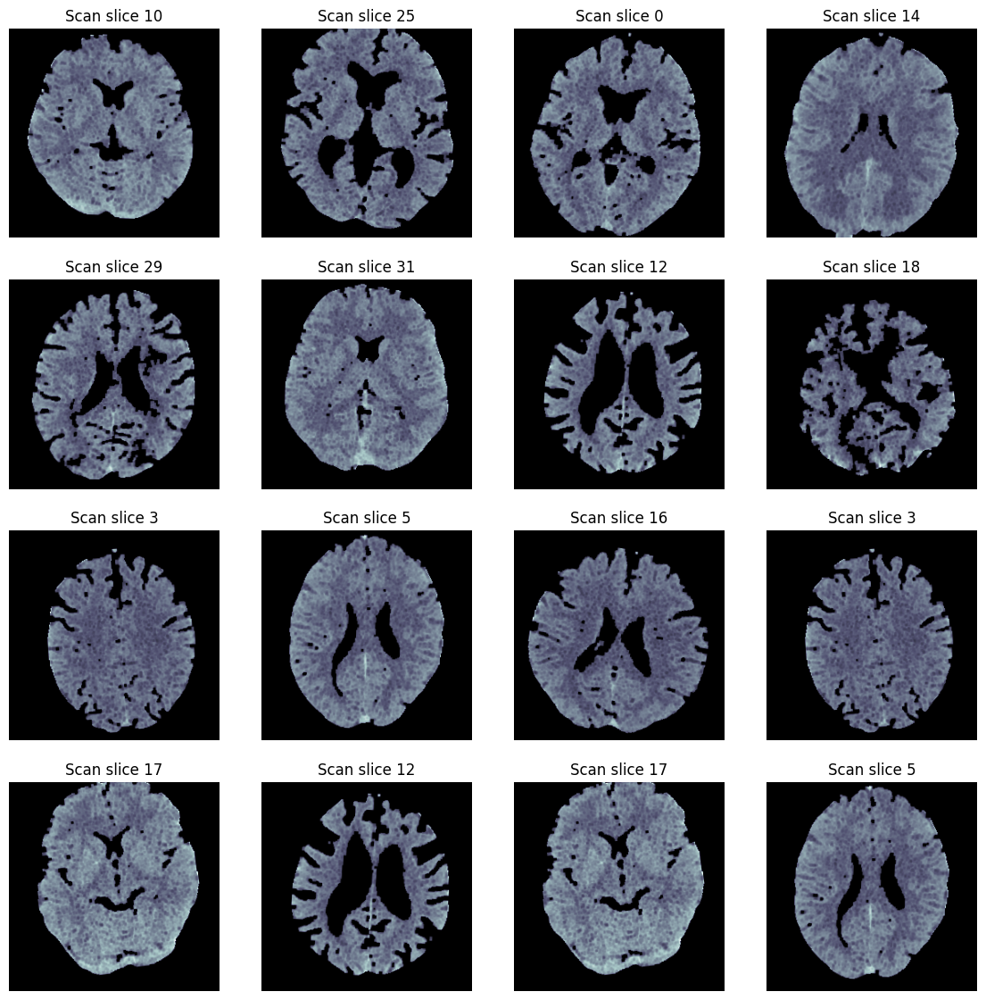

In [ ]:
aug_data = train_datagen.flow(x_train, batch_size=32).next()
plot_2d_ct_images(aug_data)

In [ ]:
%%script False
aug_data, labels = list(train_datagen.take(1))[0]
aug_data = aug_data.numpy()
aug_data.shape
plot_2d_ct_images(aug_data, rows=3, cols=3)

Couldn't find program: 'False'


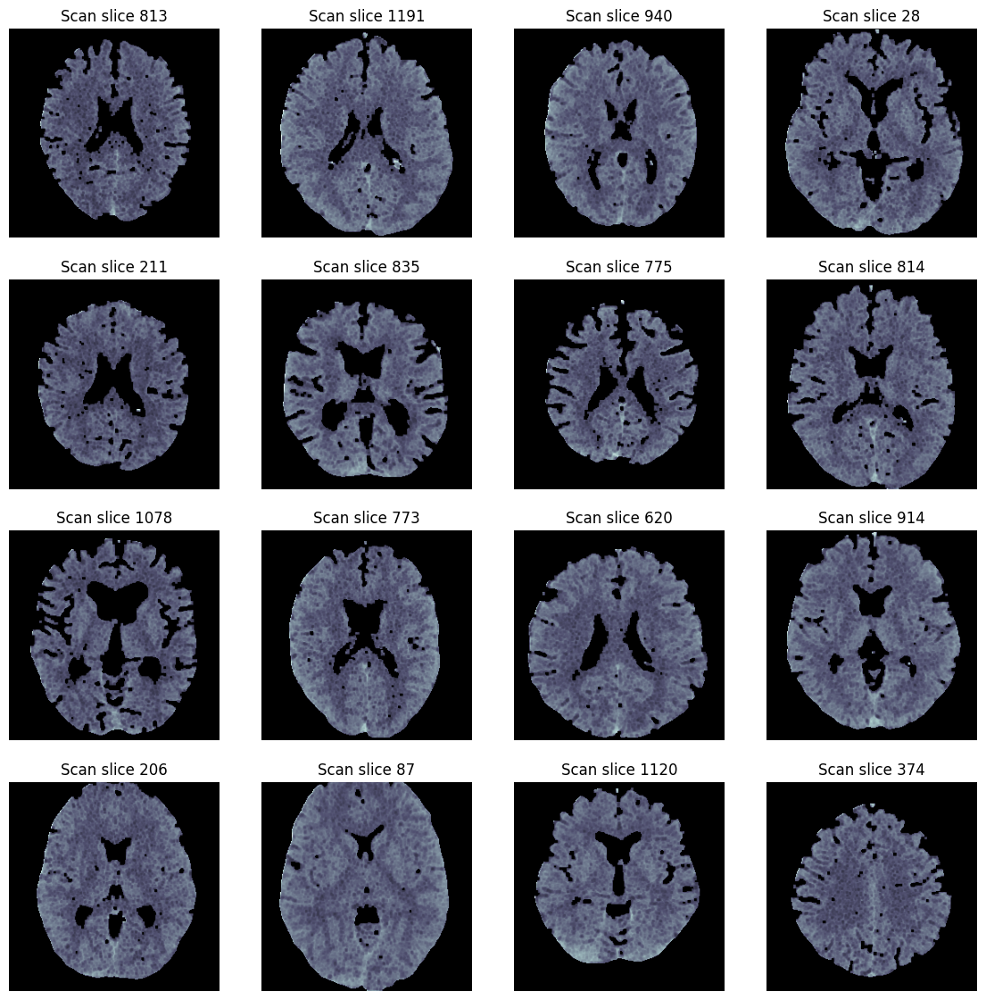

In [ ]:
plot_2d_ct_images(x_val)

## **Model training**

In this section we define our model and start training it.

### **Select model**

We use "model_type" variable to obtain model from section "helping functions" where we defined some CNN architectures for models in the beginning.

In [ ]:
model_type = 'convnext'
model = get_model(height, width, type_=model_type, use_pretrained=True)
model.build((None, height, width, 1))
model.summary()

350926856/350926856 [==============================] - 13s 0us/step
Model: "convnext"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda_g2rgb (Lambda)       (None, 256, 256, 3)       0         
                                                                 
 convnext_base (Functional)  (None, 1024)              87566464  
                                                                 
 flatten (Flatten)           (None, 1024)              0         
                                                                 
 batch_normalization (Batch  (None, 1024)              4096      
 Normalization)                                                  
                                                                 
 dense_grad (Dense)          (None, 512)               524800    
                                                                 
 dropout (Dropout)           (None, 512)               0

In [ ]:
if False:
  tf.keras.utils.plot_model(model, show_shapes=False, show_layer_names=False,
                            # rankdir='LR', # show horizontaly
                            )

### **Training parameters**

Here we define number of epochs, learning rate, callbacks, etc.

In [ ]:
epochs = 50
batch_size = 16

initial_learning_rate = 1e-5
final_learning_rate = initial_learning_rate / 10

learning_rate_decay_factor = (final_learning_rate / initial_learning_rate)**(1/epochs)
steps_per_epoch = int(len(x_train)/batch_size)

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
                  initial_learning_rate=initial_learning_rate,
                  decay_steps=steps_per_epoch,
                  decay_rate=learning_rate_decay_factor,
                  staircase=True,
                  )

model.compile(
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=False),
    optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule),
    # optimizer=tf.keras.optimizers.SGD(learning_rate=lr_schedule),
    # optimizer=tf.keras.optimizers.RMSprop(learning_rate=lr_schedule),
    metrics=[tf.keras.metrics.BinaryAccuracy(name="binary_accuracy"),
             tf.keras.metrics.Precision(name="precision"),
             tf.keras.metrics.Recall(name="recall"),
             # tf.keras.metrics.F1Score(name="f1"),
             ])

### **Callbacks**

Basic callbacks to save our model (best only) and to stop early (if validation accuracy is not increasing)

We can add *TensorBoard* callback to log each epoch accuracy, loss, fit parameters (learning rate) etc.

In [ ]:
model_drive_path = f"/content/drive/MyDrive/Diplomová práca/Models/CT_scan_model_type{model_type}.keras"

monitor_param = "val_loss"

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(model_drive_path, save_best_only=True)
early_stopping_cb = tf.keras.callbacks.EarlyStopping(monitor=monitor_param, patience=10 if not model_type == 'convnext' else 5)
# rlronp_cb = tf.keras.callbacks.ReduceLROnPlateau(monitor=monitor_param, factor=0.8, patience=2, min_lr=0.00001, verbose=1)
lr_schedule_cb = tf.keras.callbacks.LearningRateScheduler(lr_schedule, verbose=0)

tensorboard_main_logdir = f"/content/drive/MyDrive/Diplomová práca/Models/logs/scalars/0{preprocess_type}"
logdir = tensorboard_main_logdir + f"/CT_scan_model_type2D_{model_type}_processing_type{preprocess_type}_" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=logdir)

csv_logdir = f"/content/drive/MyDrive/Diplomová práca/Models/csv_logs/0{preprocess_type}/CT_scan_model_type2D_{model_type}_{datetime.now().strftime('%Y%m%d-%H%M%S')}.log"
csv_logger_cb = tf.keras.callbacks.CSVLogger(filename=csv_logdir, separator=',', append=True)

### **Model fit**

After all the steps we can finally train our neural network!

In [ ]:
history = model.fit(
        # train_dataset,
        # x_train, y_train,
        train_datagen.flow(x_train, y_train, batch_size=batch_size),
        validation_data=(x_val, y_val),
        epochs=epochs,
        batch_size=batch_size,
        shuffle=True,
        verbose=1,
        callbacks=[
            checkpoint_cb,
            early_stopping_cb,
            tensorboard_cb,
            csv_logger_cb,
            # rlronp_cb,
            lr_schedule_cb,
                   ])

Epoch 1/50
622/622 [==============================] - 766s 1s/step - loss: 0.4750 - binary_accuracy: 0.7824 - precision: 0.7649 - recall: 0.8262 - val_loss: 0.5157 - val_binary_accuracy: 0.7532 - val_precision: 0.8900 - val_recall: 0.5877 - lr: 1.0000e-05
Epoch 2/50
622/622 [==============================] - 679s 1s/step - loss: 0.4120 - binary_accuracy: 0.8114 - precision: 0.7949 - recall: 0.8481 - val_loss: 1.5471 - val_binary_accuracy: 0.5217 - val_precision: 0.5155 - val_recall: 1.0000 - lr: 9.5499e-06
Epoch 3/50
622/622 [==============================] - 685s 1s/step - loss: 0.3928 - binary_accuracy: 0.8223 - precision: 0.8124 - recall: 0.8464 - val_loss: 0.4091 - val_binary_accuracy: 0.8111 - val_precision: 0.7689 - val_recall: 0.8989 - lr: 9.1201e-06
Epoch 4/50
622/622 [==============================] - 679s 1s/step - loss: 0.3631 - binary_accuracy: 0.8412 - precision: 0.8430 - recall: 0.8454 - val_loss: 0.9401 - val_binary_accuracy: 0.5635 - val_precision: 0.9787 - val_recall: 

In order to recognized best model trained so far from all saved models we need to rename default placeholder name of saved .h5 file to new one with val_acc number at the end of the title

In [ ]:
val_acc_str = str(round(max(history.history['val_binary_accuracy']), 4)).replace('.', '')
model_path = f"/content/drive/MyDrive/Diplomová práca/Models/CT_scan_model_type{model_type}_val_acc{val_acc_str}_processing_type{preprocess_type}.keras"
os.rename(model_drive_path, model_path)
model_path

'/content/drive/MyDrive/Diplomová práca/Models/CT_scan_model_typeconvnext_val_acc08111_processing_type4.keras'

Best validation accuracy from training of our model

In [ ]:
max(history.history['val_binary_accuracy'])

0.811093270778656

**History plot**

Using *matplotlib* library we can plot history of our model training.

First plot is comparison between "training loss" and "validation loss" per epoch.

In second one we compare binary accuracy

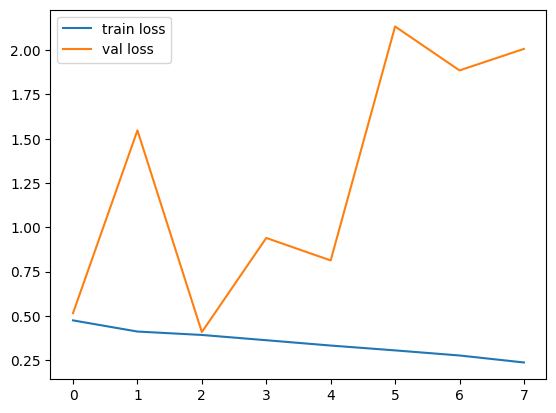

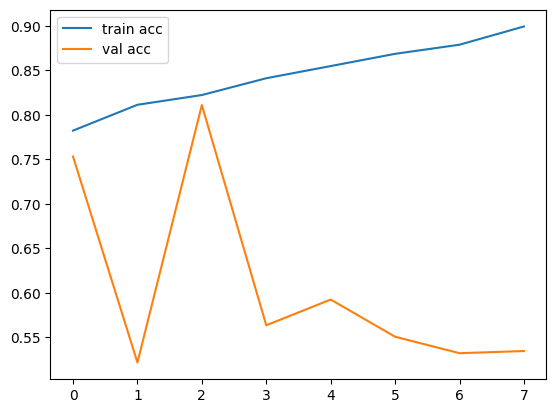

In [ ]:
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.legend()
plt.show(); # plt.savefig('LossVal_loss')

plt.plot(history.history['binary_accuracy'], label='train acc')
plt.plot(history.history['val_binary_accuracy'], label='val acc')
plt.legend()
plt.show(); # plt.savefig('AccVal_acc')

In [ ]:
model.evaluate(x_test, y_test,
               batch_size=8,
               callbacks=[
                   tensorboard_cb,
                   ],
               )[1]

156/156 [==============================] - 36s 212ms/step - loss: 1.9822 - binary_accuracy: 0.5322 - precision: 1.0000 - recall: 0.0806


0.5321543216705322

In [ ]:
preprocess_type = 5

In [ ]:
CT_scan_model_type3d_resnet50_processing_type4_20240119-133004/train

In [ ]:
tensorboard_show = True

if tensorboard_show:
  !pip install tensorrt --quiet
  %load_ext tensorboard
  tensorboard_main_logdir = f"/content/drive/MyDrive/Diplomová práca/Models/logs/scalars/0{preprocess_type}/"
  tnsbrd_path = tensorboard_main_logdir.replace(' ', '\\ \\')
  %tensorboard --logdir $tnsbrd_path
  # %reload_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6007 (pid 3275), started 0:00:32 ago. (Use '!kill 3275' to kill it.)

<IPython.core.display.Javascript object>

## **Results**

In this section we'll test our trained model on test data that has never seen before.

Model predict function generates output predictions for the input samples.
In case of binary classification (positive/negative) we can say all probabilities greater than 0.5 are of class 1 and all others are of class 0.

First we load our model

In [ ]:
#@title Layers
class StochasticDepth(tf.keras.layers.Layer):
    """Stochastic Depth module.

    It performs batch-wise dropping rather than sample-wise. In libraries like
    `timm`, it's similar to `DropPath` layers that drops residual paths
    sample-wise.

    References:
      - https://github.com/rwightman/pytorch-image-models

    Args:
      drop_path_rate (float): Probability of dropping paths. Should be within
        [0, 1].

    Returns:
      Tensor either with the residual path dropped or kept.
    """

    def __init__(self, drop_path_rate, **kwargs):
        super().__init__(**kwargs)
        self.drop_path_rate = drop_path_rate

    def call(self, x, training=None):
        if training:
            keep_prob = 1 - self.drop_path_rate
            shape = (tf.shape(x)[0],) + (1,) * (len(tf.shape(x)) - 1)
            random_tensor = keep_prob + tf.random.uniform(shape, 0, 1)
            random_tensor = tf.floor(random_tensor)
            return (x / keep_prob) * random_tensor
        return x

    def get_config(self):
        config = super().get_config()
        config.update({"drop_path_rate": self.drop_path_rate})
        return config


class LayerScale(tf.keras.layers.Layer):
    """Layer scale module.

    References:
      - https://arxiv.org/abs/2103.17239

    Args:
      init_values (float): Initial value for layer scale. Should be within
        [0, 1].
      projection_dim (int): Projection dimensionality.

    Returns:
      Tensor multiplied to the scale.
    """

    def __init__(self, init_values, projection_dim, **kwargs):
        super().__init__(**kwargs)
        self.init_values = init_values
        self.projection_dim = projection_dim

    def build(self, input_shape):
        self.gamma = self.add_weight(
            name="gamma",
            shape=(self.projection_dim,),
            initializer=tf.initializers.Constant(self.init_values),
            trainable=True,
        )

    def call(self, x):
        return x * self.gamma

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "init_values": self.init_values,
                "projection_dim": self.projection_dim,
            }
        )
        return config

In [ ]:
model = load_model(model_path, safe_mode=False)

TypeError: 'str' object is not callable

In [ ]:
# model_path = "/content/drive/MyDrive/Diplomová práca/Models/CT_scan_model_typeconvnext_val_acc09863_processing_type6.h5"
# model_path = f"/content/drive/MyDrive/Diplomová práca/Models/CT_scan_model_type{model_type}_val_acc{val_acc_str}_processing_type{preprocess_type}.keras"

model_path = "/content/drive/MyDrive/Diplomová práca/Models/CT_scan_model_typeconvnext_val_acc09582_processing_type6.keras"
# model_path = "/content/drive/MyDrive/Diplomová práca/Models/CT_scan_model_typeresnet50_val_acc0955_processing_type6.keras"
# model_path = "/content/drive/MyDrive/Diplomová práca/Models/CT_scan_model_typeresnet50_val_acc08833_processing_type5.h5"

model_type = 'convnext'
model = get_model(256, 256, type_=model_type)
height, width = 256, 256
model.build((None, height, width, 1))

model.load_weights(model_path)

In [ ]:
model.summary()

Model: "convnext"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda_g2rgb (Lambda)       (None, 256, 256, 3)       0         
                                                                 
 convnext_base (Functional)  (None, 1024)              87566464  
                                                                 
 flatten (Flatten)           (None, 1024)              0         
                                                                 
 batch_normalization (Batch  (None, 1024)              4096      
 Normalization)                                                  
                                                                 
 dense_grad (Dense)          (None, 512)               524800    
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                          

In [ ]:
model_path = "/content/drive/MyDrive/Diplomová práca/Models/CT_scan_model_typeconvnext_val_acc09863_processing_type6.h5"
model = get_model(256, 256, type_='convnext',)
height, width = 256, 256
model.build((None, height, width, 1))

model.load_weights(model_path) # , safe_mode=False)
#tf.saved_model.load(model_path)

with tf.keras.utils.custom_object_scope({"LayerScale": LayerScale , "StochasticDepth": StochasticDepth, "LayerNormalization": tf.keras.layers.LayerNormalization}):
  model = load_model(model_path,
                   compile=False,
                   safe_mode=False,
                   # custom_objects={"LayerScale": LayerScale , "StochasticDepth": StochasticDepth}
)

# model = load_model(model_path)

### Predict results

#### **Reshape test data**

In [ ]:
x_test.shape

In [ ]:
%%script False
n_test = len(x_test)
x_test = x_test.reshape((n_test * depth, heigth, width))
raise ValueError("Treba urobit hlasovanie - rozdelit ")

### Vote

In [ ]:
%%script False
indx = np.random.randint(0, len(x_test))
x_test_rando = x_test[indx]
y_test_rando = y_test[indx]

y_pred_scan = model.predict(x_test_rando)
count = np.count_nonzero(y_pred_scan)
res.append(1 if count > depth//2 else 0)

rows, cols = 3, 3
index = 0
fig, ax = plt.subplots(rows, cols, figsize=[8, 8])
for i in range(rows):
  for j in range(cols):
    ax[i, j].set_title(f'Scan slice {index}')
    ax[i, j].imshow(x_test_rando[index], aspect='auto', cmap=plt.cm.bone)
    ax[i, j].axis('off')

    index += 1

plt.show()


In [ ]:
%%script False
res = []
for scan in x_test:
  y_pred_scan = model.predict(x_test)
  count = np.count_nonzero(y_pred_scan)
  res.append(1 if count > depth//2 else 0)

  fig, ax = plt.subplots(rows, cols, figsize=[8, 8])
  for i in range(rows):
    for j in range(cols):
      index = np.random.randint(0, len(x_train))
      ax[i, j].set_title(f'Scan slice {index}')
      ax[i, j].imshow(x_train[index], aspect='auto', cmap=plt.cm.bone)
      ax[i, j].axis('off')

  plt.show()

  # @TODO zratat kolko spravne a nasledne vyhodnotit celkovo

### Predict

In [ ]:
y_pred = model.predict(x_test,
                       batch_size=32
                       ).flatten()

y_pred[y_pred > 0.5] = 1
y_pred[y_pred <= 0.5] = 0

39/39 [==============================] - 44s 845ms/step


In [ ]:
# np.count_nonzero returns count elementwise matches for y_pred and y_test arrays
acc = np.count_nonzero(y_pred == y_test) / len(x_test)
print("Accuracy of the model is - " , acc*100 , "%")

Accuracy of the model is -  95.33762057877814 %


In [ ]:
model.evaluate(x_test, y_test, batch_size=64)

20/20 [==============================] - 0s 5ms/step - loss: 0.0000e+00


0.0

In [ ]:
# Same result using tensorflow evaluate function
print("Accuracy of the model is - " , model.evaluate(x_test, y_test, batch_size=64)[1]*100 , "%")

20/20 [==============================] - 3s 5ms/step - loss: 0.0000e+00


TypeError: 'float' object is not subscriptable

### Confusion matrix

A confusion matrix is a table that is used to define the performance of a classification algorithm.

In [ ]:
confusion_matrix = tf.math.confusion_matrix(y_test, y_pred)
confusion_matrix

In [ ]:
import seaborn as sns

sns.heatmap(confusion_matrix, annot=True, cmap='Greens')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Visualize activation heatmap
https://stackoverflow.com/questions/66911470/how-to-apply-grad-cam-on-my-trained-model

https://keras.io/examples/vision/grad_cam/

In [ ]:
def unwrap_model(model, model_type=model_type):
    func_model = [model.get_layer(layer.name) for layer in model.layers if model_type in layer.name][0]
    inp = func_model.input
    out = model.get_layer('dropout')(func_model.output)
    try:
      out = model.get_layer('dense_grad')(out)
    except ValueError:
      out = model.get_layer(model.layers[-3].name)(out)
    return Model(inp, out)

new_model = unwrap_model(model)
new_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 convnext_base_prestem_norm  (None, 256, 256, 3)          0         ['input_2[0][0]']             
 alization (Normalization)                                                                        
                                                                                                  
 convnext_base_stem (Sequen  (None, 64, 64, 128)          6528      ['convnext_base_prestem_normal
 tial)                                                              ization[0][0]']               
                                                                                              

In [ ]:
#@title GradCAM
import cv2
import matplotlib as mpl


class GradCAM:
    def __init__(self, model, classIdx, layerName=None, func_model=None):
        # store the model, the class index used to measure the class
        # activation map, and the layer to be used when visualizing
        # the class activation map
        self.model = model
        self.classIdx = classIdx
        self.layerName = layerName
        self.func_model = func_model
        # if the layer name is None, attempt to automatically find
        # the target output layer
        if self.layerName is None:
            self.layerName = self.find_target_layer()

    def find_target_layer(self):
        # attempt to find the final convolutional layer in the network
        # by looping over the layers of the network in reverse order
        for layer in reversed(self.model.get_layer(self.func_model).layers):
            # check to see if the layer has a 4D output
            if len(layer.output_shape) == 4:
                return layer.name
        # otherwise, we could not find a 4D layer so the GradCAM
        # algorithm cannot be applied
        raise ValueError("Could not find 4D layer. Cannot apply GradCAM.")


    def _compute_heatmap(self, image, eps=1e-8):
        # construct our gradient model by supplying (1) the inputs
        # to our pre-trained model, (2) the output of the (presumably)
        # final 4D layer in the network, and (3) the output of the
        # softmax activations from the model
        gradModel = Model(
            inputs=[self.model.inputs], #get_layer('resnet50').get_layer('input_2').input],
            outputs=[self.model.get_layer(self.layerName).output, self.model.output])


        # record operations for automatic differentiation
        with tf.GradientTape() as tape:
            # cast the image tensor to a float-32 data type, pass the
            # image through the gradient model, and grab the loss
            # associated with the specific class index
            inputs = tf.cast(image, tf.float32)
            (convOutputs, predictions) = gradModel(inputs)

            loss = predictions[:, tf.argmax(predictions[0])]

        # use automatic differentiation to compute the gradients
        grads = tape.gradient(loss, convOutputs)

        # compute the guided gradients
        castConvOutputs = tf.cast(convOutputs > 0, "float32")
        castGrads = tf.cast(grads > 0, "float32")
        guidedGrads = castConvOutputs * castGrads * grads
        # the convolution and guided gradients have a batch dimension
        # (which we don't need) so let's grab the volume itself and
        # discard the batch
        convOutputs = convOutputs[0]
        guidedGrads = guidedGrads[0]

        # compute the average of the gradient values, and using them
        # as weights, compute the ponderation of the filters with
        # respect to the weights
        weights = tf.reduce_mean(guidedGrads, axis=(0, 1))
        cam = tf.reduce_sum(tf.multiply(weights, convOutputs), axis=-1)

        # grab the spatial dimensions of the input image and resize
        # the output class activation map to match the input image
        # dimensions
        (w, h) = (image.shape[2], image.shape[1])
        heatmap = cv2.resize(cam.numpy(), (w, h))
        # normalize the heatmap such that all values lie in the range
        # [0, 1], scale the resulting values to the range [0, 255],
        # and then convert to an unsigned 8-bit integer
        numer = heatmap - np.min(heatmap)
        denom = (heatmap.max() - heatmap.min()) + eps
        heatmap = numer / denom
        heatmap = (heatmap * 256).astype(np.uint8)

        return heatmap

    def compute_heatmap(self, img_array, pred_index=None):
      last_conv_layer_name = self.layerName
      model = self.model
      # First, we create a model that maps the input image to the activations
      # of the last conv layer as well as the output predictions
      grad_model = keras.models.Model(
          model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
      )

      # Then, we compute the gradient of the top predicted class for our input image
      # with respect to the activations of the last conv layer
      with tf.GradientTape() as tape:
          last_conv_layer_output, preds = grad_model(img_array)
          if pred_index is None:
              pred_index = tf.argmax(preds[0])
          class_channel = preds[:, pred_index]

      # This is the gradient of the output neuron (top predicted or chosen)
      # with regard to the output feature map of the last conv layer
      grads = tape.gradient(class_channel, last_conv_layer_output)

      # This is a vector where each entry is the mean intensity of the gradient
      # over a specific feature map channel
      pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

      # We multiply each channel in the feature map array
      # by "how important this channel is" with regard to the top predicted class
      # then sum all the channels to obtain the heatmap class activation
      last_conv_layer_output = last_conv_layer_output[0]
      heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
      heatmap = tf.squeeze(heatmap)

      # For visualization purpose, we will also normalize the heatmap between 0 & 1
      heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
      return heatmap.numpy()


    def save_and_display_gradcam(self, img, heatmap, alpha=0.4):

      # Rescale heatmap to a range 0-255
      heatmap = np.uint8(255 * heatmap)

      # Use jet colormap to colorize heatmap
      jet = mpl.colormaps["jet"]

      # Use RGB values of the colormap
      jet_colors = jet(np.arange(256))[:, :3]
      # jet_colors = jet(np.arange(256))[:, :3]
      jet_heatmap = jet_colors[heatmap]


      # Create an image with RGB colorized heatmap
      # print(jet_heatmap.shape)
      jet_heatmap = keras.utils.array_to_img(jet_heatmap)
      jet_heatmap = jet_heatmap.resize((256, 256))
      jet_heatmap = keras.utils.img_to_array(jet_heatmap)

      # Superimpose the heatmap on original image
      superimposed_img = jet_heatmap * alpha + img
      superimposed_img = keras.utils.array_to_img(superimposed_img)

      return superimposed_img

    def overlay_heatmap(self, heatmap, image, alpha=0.5,
                        colormap=cv2.COLORMAP_VIRIDIS):

        image = image * 256
        image = image.astype(np.uint8)
        if image.shape[-1] == 1:
          image = np.repeat(image, 3, axis=-1)

        if heatmap.dtype == "float32":
          heatmap = (heatmap * 256).astype(np.uint8)

        heatmap = cv2.applyColorMap(heatmap, colormap)
        output = cv2.addWeighted(image, alpha, heatmap, 1 - alpha, 0)

        return (heatmap, output)

In [ ]:
last_conv_layer_name = list(filter(lambda x: 'conv' in str(x), new_model.layers))[-1].name
last_conv_layer_name

In [ ]:
last_conv_layer_name = 'convnext_base_stage_3_block_2_depthwise_conv'
last_conv_layer_name = 'convnext_base_stage_3_block_2_pointwise_conv_2'
last_conv_layer_name = 'conv5_block3_add'

In [ ]:
img_cv.shape

In [ ]:
# %%script False
import cv2

n = 10

indx = np.random.randint(0, len(x_test), size=10)
imgs = x_test[indx][:, :, :, 0]
imgs = np.stack([imgs]*3, axis=-1)
# img = np.expand_dims(img, axis=0)

new_model = unwrap_model(model)
new_model.layers[-1].activation = None
icam = GradCAM(new_model, "_", last_conv_layer_name, 'resnet50')

for i in range(n):
  img = imgs[i]
  img = np.expand_dims(img, axis=0)
  heatmap = icam.compute_heatmap(img)

  # img_cv = cv2.cvtColor(img.astype('float32'), cv2.COLOR_GRAY2RGB)
  img_cv = img[0]
  # heatmap = np.expand_dims(heatmap, axis=-1)
  # heatmap = np.stack([heatmap]*3, axis=-1)

  # (heatmap, output) = icam.overlay_heatmap(heatmap, img_cv, alpha=0.5)

  output = icam.save_and_display_gradcam(img_cv, heatmap, alpha=0.5)


  # grayscale_map = plt.get_cmap('jet')

  plt.figure()
  plt.imshow(output) # , cmap=grayscale_map)
  plt.colorbar()


In [ ]:
img_cv

In [ ]:
plt.matshow(img_cv)
plt.show()

## GradCAM 2.0

In [ ]:
unwrapped_model = unwrap_model(model)
# last_conv_layer_name = 'conv5_block3_3_conv'
last_conv_layer_name = list(filter(lambda x: 'conv' in str(x), new_model.layers))[-1].name
last_conv_layer_name = 'convnext_base_stage_3_block_2_depthwise_conv'
# last_conv_layer_name = 'conv5_block3_add'

grad_model = Model(
    inputs=unwrapped_model.inputs,
    outputs=[unwrapped_model.get_layer(last_conv_layer_name).output, unwrapped_model.output]
)

In [ ]:
def almost_equals(a, b, decimal=6):
    try:
        np.testing.assert_almost_equal(a, b, decimal=decimal)
    except AssertionError:
        return False
    return True

In [ ]:
grad_info = {}
for fname in range(10):
    # Get the normalized input, class(int) and label (string) for each image

    indx = np.random.randint(0, len(x_test))
    img = x_test[indx][:, :, 0]
    img = np.stack([img]*3, axis=-1)
    img = np.expand_dims(img, axis=0)
    cls = y_test[indx]
    label = cls
    # img, cls, label = get_image_class_label(fname, val_df, class_indices, words)

    # Monitoring the gradients in the GradientTape context
    with tf.GradientTape(persistent=True) as tape:
        # tape.watch(img)
        conv_output, preds = grad_model(img, training=True)
        loss = preds[:, cls]

    # Get the gradient
    grads = tape.gradient(loss, conv_output)
    zeros_like_grads = np.zeros_like(grads.numpy())
    for decimal in range(3, 0, -1):
        print('decimal: {0}: {1}'.format(decimal, almost_equals(
                                                        zeros_like_grads,
                                                        grads.numpy(),
                                                        decimal=decimal)))
    # print(conv_output)
    # Apply weights
    weights = tf.reduce_mean(grads, axis=(1, 2), keepdims=True)
    grads *= weights
    # Get the final heatmap
    grads = tf.reduce_sum(grads, axis=(0,3))
    grads = tf.nn.relu(grads)

    # normalize
    grads /= tf.reduce_max(grads)
    grads = tf.cast(grads*255.0, 'uint8')

    grad_info[fname] = {'image': img, 'class': cls, 'label':label, 'gradcam': grads}
    # print(fname, grads)

print("Collected {} GradCAMs".format(len(grad_info)))

decimal: 3: True
decimal: 2: True
decimal: 1: True
decimal: 3: False
decimal: 2: True
decimal: 1: True
decimal: 3: False
decimal: 2: True
decimal: 1: True
decimal: 3: False
decimal: 2: True
decimal: 1: True
decimal: 3: False
decimal: 2: True
decimal: 1: True
decimal: 3: True
decimal: 2: True
decimal: 1: True
decimal: 3: True
decimal: 2: True
decimal: 1: True
decimal: 3: True
decimal: 2: True
decimal: 1: True
decimal: 3: False
decimal: 2: True
decimal: 1: True
decimal: 3: True
decimal: 2: True
decimal: 1: True
Collected 10 GradCAMs


In [ ]:
from matplotlib.colors import LinearSegmentedColormap

ncolors = 256
cmap_name = 'jet'
color_array = plt.get_cmap(cmap_name)(range(ncolors))
# change alpha values
color_array[:,-1] = np.linspace(0.0,1.0,ncolors)
map_object = LinearSegmentedColormap.from_list(name='{}_alpha'.format(cmap_name),colors=color_array)
try:
  plt.colormaps.register(map_object)
except ValueError:
  pass

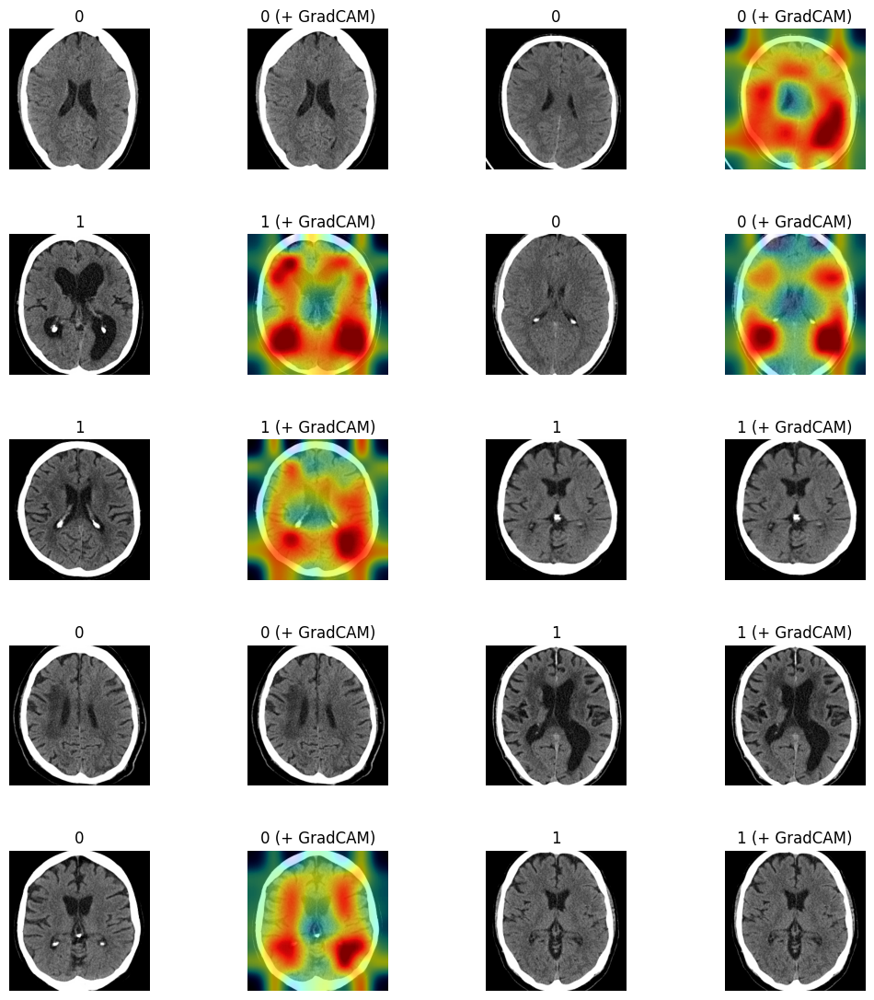

In [ ]:
from PIL import Image

# Define figure
f, axes = plt.subplots(5, 4, figsize=(12,14))
plt.subplots_adjust(wspace=0.7)
plt.title(f'{model_path}')

for i, (k, v) in enumerate(grad_info.items()):

    cam = np.array(Image.fromarray(v["gradcam"].numpy()).resize((height,width)))
    # orig_image = ((v["image"][0]+1)*127.5).astype('uint8')
    orig_image = ((v["image"][0])*255).astype('uint8')
    offset = 2*(i%2)

    # Plotting each image
    axes[i//2][offset].imshow(orig_image)
    # Plotting w GradCAM
    axes[i//2][offset+1].imshow(orig_image)
    axes[i//2][offset+1].imshow(cam,cmap='{}_alpha'.format(cmap_name))

    # Set labels and turning off axes
    axes[i//2][offset].set_title(v["label"])
    axes[i//2][offset+1].set_title(str(v["label"]) + " (+ GradCAM)")
    axes[i//2][offset].axis('off')
    axes[i//2][offset+1].axis('off')